In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
from io import BytesIO
from PIL import Image as PIL_Image
import numpy as np
from IPython.display import display, Image

def display_img_array(ima, **kwargs):
    if ima.dtype == np.float32 or ima.dtype == np.float64:
        ima = (np.clip(ima, 0., 1.)*255).astype(np.uint8)
    im = PIL_Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png', **kwargs))

In [3]:
import os
import urllib
from urllib.request import urlretrieve
dataset = 'mnist.pkl.gz'
def reporthook(a,b,c):
    print("\rdownloading: %5.1f%%"%(a*b*100.0/c), end="")
    
if not os.path.isfile(dataset):
        origin = "https://github.com/mnielsen/neural-networks-and-deep-learning/raw/master/data/mnist.pkl.gz"
        print('Downloading data from %s' % origin)
        urlretrieve(origin, dataset, reporthook=reporthook)

In [4]:
import gzip
import pickle
with gzip.open(dataset, 'rb') as f:
    train_set, valid_set, test_set = pickle.load(f, encoding='latin1')

In [5]:
train_set = (np.concatenate([train_set[0], valid_set[0]]),   np.concatenate([train_set[1], valid_set[1]]))

In [6]:
print("train_set", train_set[0].shape, train_set[1].shape)
print("test_set", test_set[0].shape, test_set[1].shape)

train_set (60000, 784) (60000,)
test_set (10000, 784) (10000,)


In [7]:
IMG_C, IMG_W, IMG_H=1,28,28

In [8]:
def show(x):
    x = x.reshape(-1, IMG_C, IMG_H, IMG_W)
    w = min(x.shape[0]*100, 800)
    x = x.swapaxes(0, 1).swapaxes(1,2)
    if IMG_C == 1:
        img = x.reshape(IMG_H, -1)
    else:
        x = x.reshape(IMG_C, IMG_H, -1)
        img = np.swapaxes(x, 0, 1)
        img = np.swapaxes(img, 1, 2)
    display_img_array(img, width=w)    
for i in range(3):
    show(train_set[0][i])
show(train_set[0][:10])

In [9]:
import sys
sys.setrecursionlimit(10000)

In [10]:
import numpy as np
import theano
import theano.tensor as T
import lasagne
from lasagne.layers import DenseLayer, DropoutLayer, ReshapeLayer, InputLayer, FlattenLayer, Upscale2DLayer, LocalResponseNormalization2DLayer
floatX = theano.config.floatX

Using gpu device 0: GeForce GTX 1080 (CNMeM is disabled, cuDNN 5105)


In [11]:
from lasagne.layers.dnn import MaxPool2DDNNLayer, Conv2DDNNLayer
from lasagne.layers import TransposedConv2DLayer

In [12]:
from lasagne.layers import ElemwiseSumLayer, NonlinearityLayer, GlobalPoolLayer, ConcatLayer
from lasagne.nonlinearities import rectify
from lasagne.layers import get_output
def batch_norm(x):
    return lasagne.layers.batch_norm(x, gamma=lasagne.init.Normal(1., 0.02))

In [13]:
from lasagne.objectives import categorical_crossentropy, binary_crossentropy, categorical_accuracy, binary_accuracy

In [14]:
from lasagne.nonlinearities import LeakyRectify, rectify, sigmoid, linear, softmax
lRELU = LeakyRectify(0.01)
RELU =rectify

In [15]:
def conv2d(*args, **kwargs):
    return Conv2DDNNLayer(*args, W=lasagne.init.Normal(std=0.02), **kwargs)
def deconv2d(*args, **kwargs):
    return TransposedConv2DLayer(*args, W=lasagne.init.Normal(std=0.02), **kwargs)
def dense(*args, **kwargs):
    return DenseLayer(*args, W=lasagne.init.Normal(std=0.02), **kwargs)

In [16]:
input_Y = T.matrix()  # discrete latent variable (1  10-category)
input_C = T.matrix()  # continuous latent variable 
input_Z = T.matrix()  # noise (NU gaussian)
input_X = T.matrix()  # image
target_var = T.matrix() # discriminator target

_ = InputLayer(shape=(None, IMG_C*IMG_H*IMG_W), input_var=input_X)
_ = ReshapeLayer(_, ([0], IMG_C, IMG_H, IMG_W))
_ = conv2d(_, 64, 4, stride=2, nonlinearity=lRELU, pad=1)
_ = batch_norm(conv2d(_, 128, 4, stride=2, nonlinearity=lRELU, pad=1))
_ = batch_norm(dense(_, num_units=1024, nonlinearity=lRELU))
l_discriminator = dense(_, num_units=1, nonlinearity=sigmoid)
l_Q_Y = dense(_, num_units=10, nonlinearity=softmax)

_ = batch_norm(dense(_, num_units=128, nonlinearity=lRELU))
l_Q_C_mean = dense(_, num_units=2, nonlinearity=linear)
l_Q_C_stddev = dense(_, num_units=2, nonlinearity=T.exp)


NU = 64 # dim of noise
CU = 2 # dim of continuous latent variable
input_var2 = T.matrix()
_Y = InputLayer(shape=(None, 10), input_var=input_Y)
_C = InputLayer(shape=(None, CU), input_var=input_C)
_Z = InputLayer(shape=(None, NU), input_var=input_Z)
_ = ConcatLayer((_Y, _C, _Z))
_ = batch_norm(dense(_, num_units=1024, nonlinearity=RELU))
_ = batch_norm(dense(_, num_units=128*(IMG_H//4)*(IMG_W//4), nonlinearity=RELU))
_ = ReshapeLayer(_, ([0], 128, IMG_H//4, IMG_W//4))
_ = batch_norm(deconv2d(_, 64, 4, stride=2, nonlinearity=RELU, crop=1))
_ = batch_norm(deconv2d(_, 1, 4, stride=2, nonlinearity=RELU, crop=1))
l_generator = FlattenLayer(_)

def clip(x):
    return T.clip(x, 1e-8, 1-1e-8)

output_generator_deterministic = get_output(l_generator, deterministic=True)
output_discriminator = get_output(l_discriminator) #, batch_norm_use_averages=True)
output_Q_Y = get_output(l_Q_Y)

output_generator = get_output(l_generator)

output_generator_discriminator = get_output(l_discriminator, inputs=output_generator, 
                                            deterministic=False)
output_generator_Q_Y, output_generator_Q_C_mean, output_generator_Q_C_stddev =\
        get_output((l_Q_Y, l_Q_C_mean, l_Q_C_stddev),
                    inputs=output_generator, deterministic=False)

TINY = 1e-8

loss_discriminator0 = -T.log(output_discriminator + TINY).mean() -  T.log(1. - output_generator_discriminator + TINY).mean()
loss_generator0 = -T.log(output_generator_discriminator + TINY).mean()

loss_Q_Y = categorical_crossentropy(clip(output_generator_Q_Y), input_Y).mean()


epsilon = (input_C - output_generator_Q_C_mean) /(output_generator_Q_C_stddev + TINY)
loss_Q_C = (T.log(output_generator_Q_C_stddev + TINY) + 0.5 * T.square(epsilon)).mean()

loss_discriminator = loss_discriminator0 + loss_Q_Y  + loss_Q_C
loss_generator = loss_generator0 + loss_Q_Y  + loss_Q_C


accuracy_generator = binary_accuracy(output_generator_discriminator, 
                                     T.zeros_like(output_generator_discriminator)).mean()
accuracy_discriminator = binary_accuracy(output_discriminator, T.ones_like(output_generator_discriminator)).mean()
accuracy_discriminator = (accuracy_discriminator + accuracy_generator)/2
accuracy_Q_Y = categorical_accuracy(output_generator_Q_Y, input_Y).mean()

params_discriminator = lasagne.layers.get_all_params([l_discriminator, l_Q_Y, l_Q_C_mean, l_Q_C_stddev], 
                                                     trainable=True) 
params_generator = lasagne.layers.get_all_params(l_generator, trainable=True) 

updates_generator = lasagne.updates.adam(loss_generator, 
                                            params_generator, 
                                            learning_rate=1e-3,  beta1=0.5)
updates_discriminator = lasagne.updates.adam(loss_discriminator, 
                                                params_discriminator, 
                                                learning_rate=2e-4,  beta1=0.5)

train_generator_fn = theano.function([input_Y, input_C, input_Z], 
                                     (loss_generator0, loss_Q_Y, loss_Q_C, 
                                      accuracy_generator, accuracy_Q_Y), 
                                     updates=updates_generator)
train_discriminator_fn = theano.function([input_X, input_Y, input_C, input_Z], 
                                         (loss_discriminator0, loss_Q_Y, loss_Q_C, 
                                          accuracy_discriminator, accuracy_Q_Y), 
                                         updates=updates_discriminator)

generator_fn = theano.function([input_Y, input_C, input_Z], output_generator_deterministic)

In [17]:
logf = open('mnist-infogan-v3.log', 'w')
import sys
def printx(*args, **kwargs):
    print(*args, **kwargs)    
    print(*args, file=logf, **kwargs)
    logf.flush()
    sys.stdout.flush()

In [18]:
import sys
from random import randint
X=train_set[0] #[train_set[1]==5]
Y=train_set[1].astype('int32')
X_test = test_set[0]
Y_test = test_set[1].astype('int32')
last_imgs = None
j = 0
batch_size=128

In [19]:
def sample_X(batch_size=batch_size):
    idx = np.random.randint(0, train_set[0].shape[0], size=batch_size)
    return train_set[0][idx]

def sample_Y(batch_size=batch_size):
    input_Y = np.zeros((batch_size, 10), dtype='float32')
    random_y=np.random.randint(0, 10, size=batch_size)
    input_Y[np.arange(batch_size), random_y] = 1
    return input_Y

def sample_Z(batch_size=batch_size):
    return (np.random.uniform(low=-1, high=1, size=(batch_size, NU))).astype('float32')

def sample_C(batch_size=batch_size):
    return (np.random.uniform(low=-1, high=1, size=(batch_size, CU))).astype('float32')

In [20]:
import scipy.stats
ppf = scipy.stats.norm.ppf
def show_result(N=16):
    results=[]
    for j in range(10):
        pic=None
        for x in range(N):
            row = None    
            C = np.array([ [ppf(0.05*(x+1)), ppf(0.05*(y+1))] for y in range(N)], dtype='float32')
            Y=np.zeros((N,10),dtype='float32')
            Y[:,j]=1
            row = generator_fn(Y, C, sample_Z(N))
            row = row.reshape(-1, IMG_H, IMG_W)
            row = row.swapaxes(0,1).reshape(IMG_H, -1)
            pic = row if pic is None else np.concatenate((pic,row), axis=0)
        results.append(pic)
    display_img_array(np.concatenate(results[:5], axis=1))
    display_img_array(np.concatenate(results[5:], axis=1))

epoch= 0


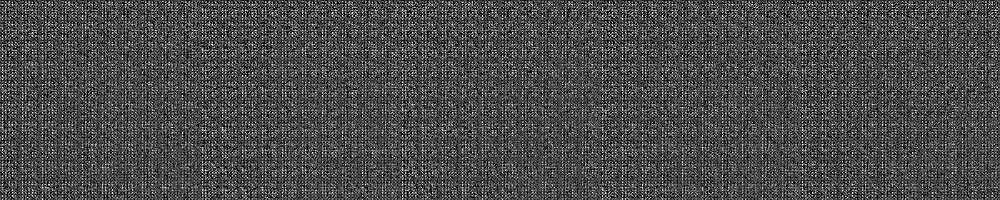

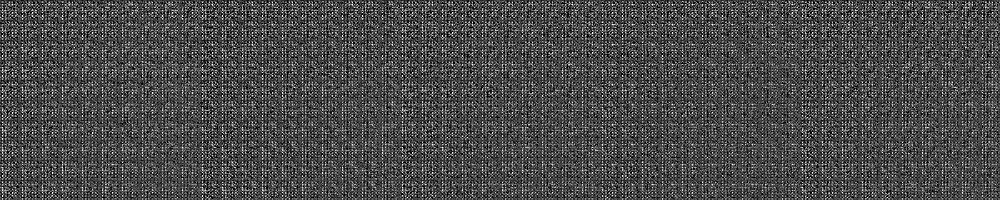

d_err 0.9354540109634399 0.9609375
qy_err 0.04089616984128952 1.0
g_err 1.0200550556182861 0.9921875
qy_err 0.049892909824848175 1.0
qc_err -0.973491370677948 -0.9657531976699829
epoch= 1


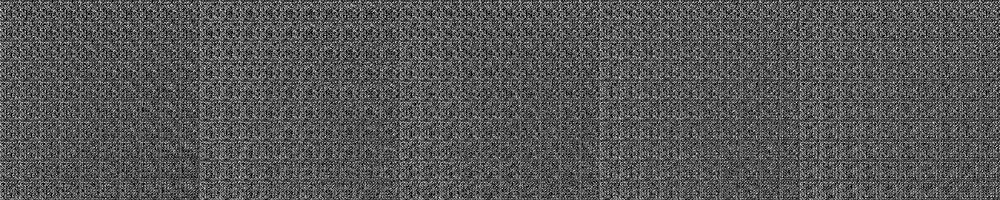

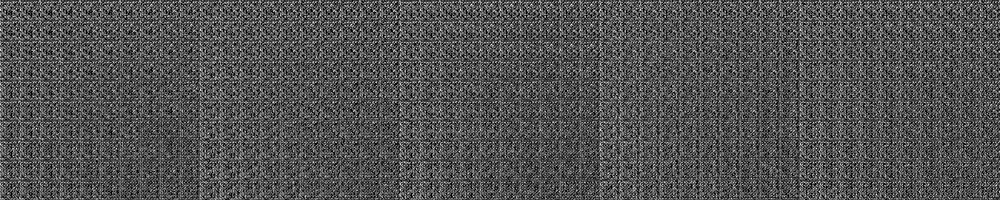

d_err 0.6505187749862671 0.96875
qy_err 0.07134351879358292 1.0
g_err 1.488692045211792 1.0
qy_err 0.0690368115901947 1.0
qc_err -1.2617194652557373 -1.2727868556976318
epoch= 2


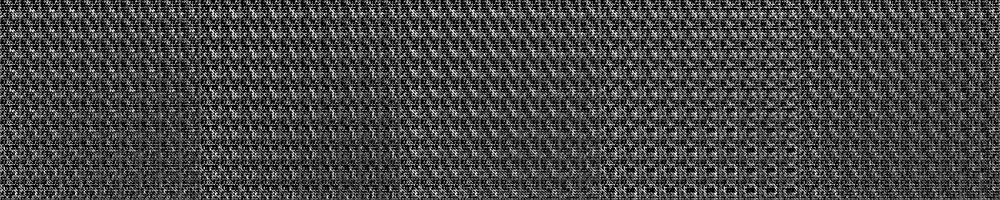

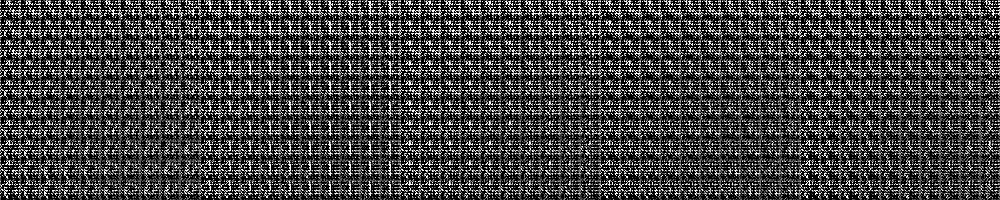

d_err 0.49674317240715027 1.0
qy_err 0.07628583908081055 1.0
g_err 1.5875169038772583 1.0
qy_err 0.06299188733100891 1.0
qc_err -1.5151779651641846 -1.2223944664001465
epoch= 3


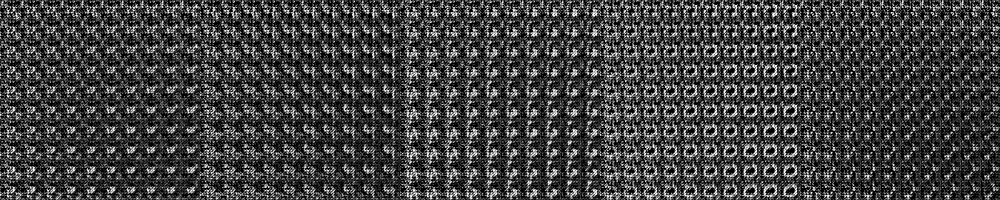

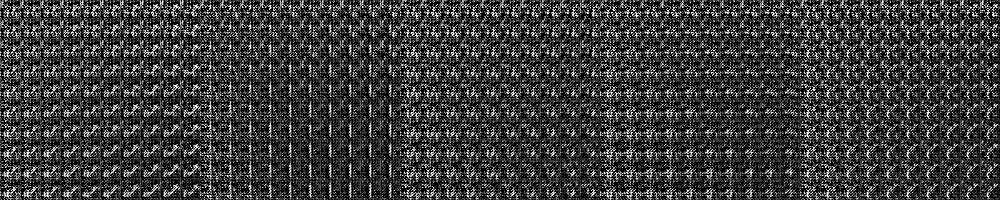

d_err 0.5118029117584229 0.984375
qy_err 0.03139138221740723 1.0
g_err 1.6429519653320312 0.9921875
qy_err 0.03600737452507019 1.0
qc_err -1.4933648109436035 -1.5920072793960571
epoch= 4


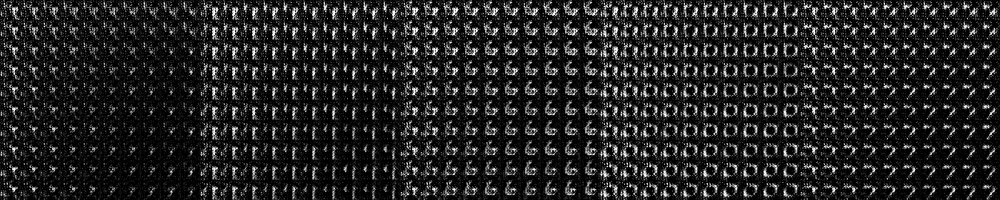

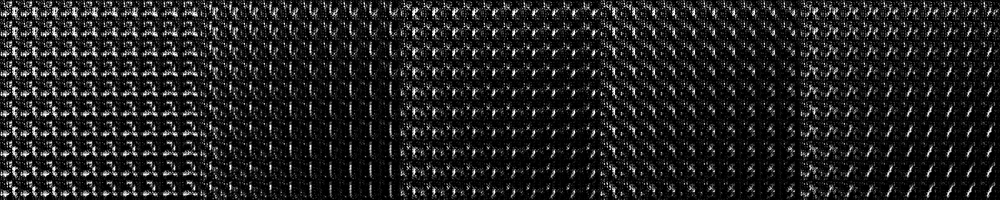

d_err 0.41140037775039673 0.99609375
qy_err 0.0288735069334507 1.0
g_err 1.7491965293884277 1.0
qy_err 0.028447270393371582 1.0
qc_err -1.4540849924087524 -1.0196006298065186
epoch= 5


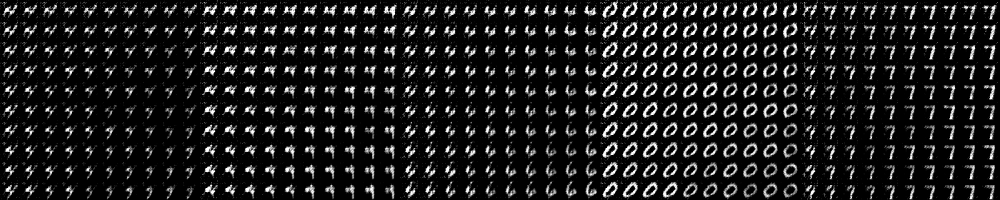

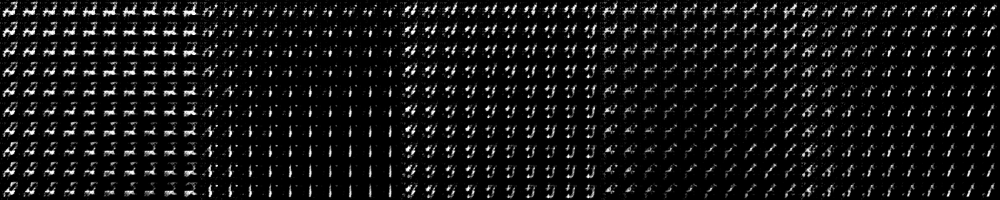

d_err 0.7577301263809204 0.88671875
qy_err 0.02458810806274414 1.0
g_err 1.515824556350708 1.0
qy_err 0.035065650939941406 1.0
qc_err -1.4314439296722412 -1.5530462265014648
epoch= 6


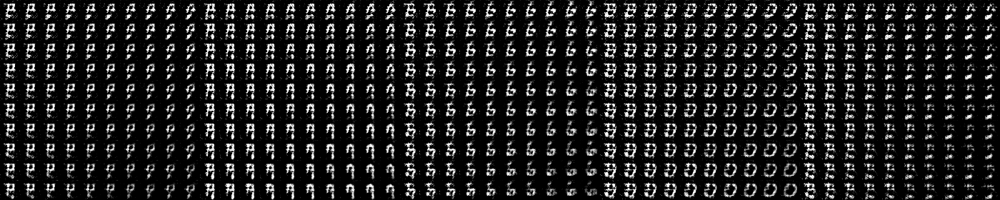

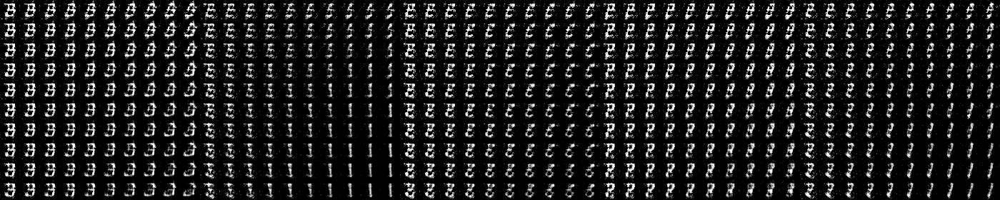

d_err 0.6798677444458008 0.93359375
qy_err 0.030483191832900047 1.0
g_err 1.4246262311935425 0.984375
qy_err 0.025481652468442917 1.0
qc_err -1.3271406888961792 -1.6614519357681274
epoch= 7


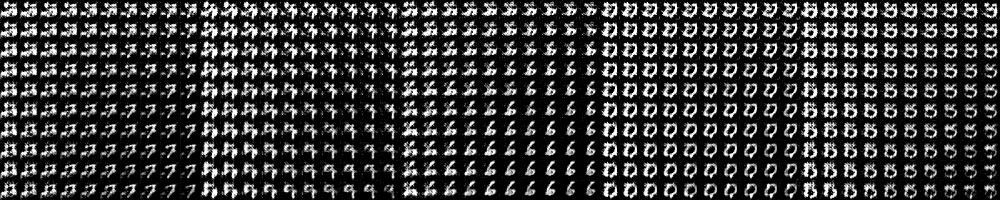

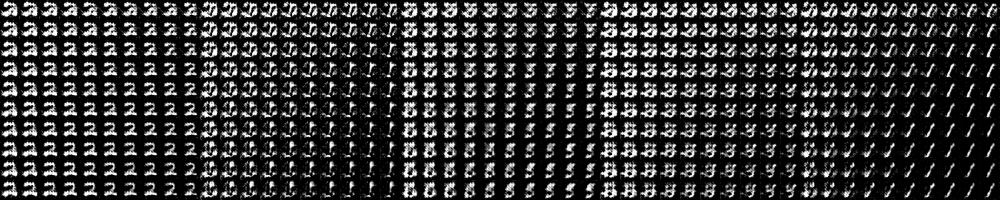

d_err 0.44372308254241943 0.9921875
qy_err 0.020523950457572937 1.0
g_err 1.6809152364730835 1.0
qy_err 0.017376143485307693 1.0
qc_err -1.868484377861023 -1.7907472848892212
epoch= 8


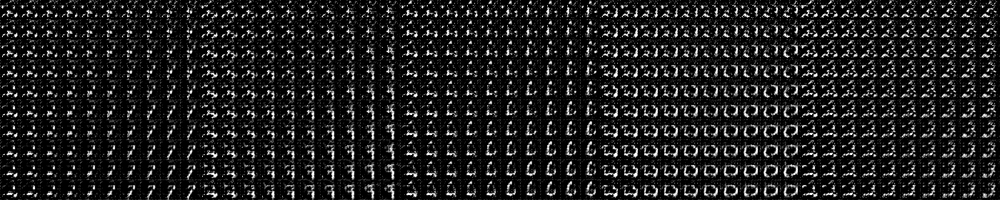

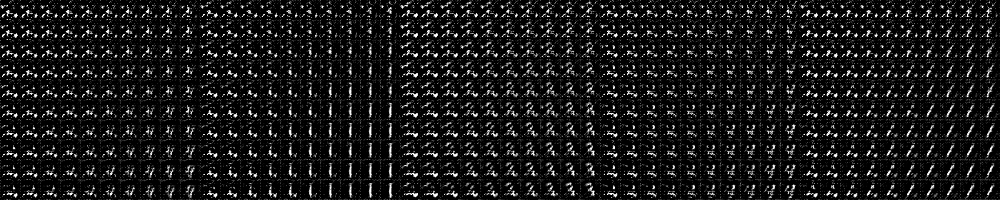

d_err 0.4937300682067871 0.9921875
qy_err 0.021630775183439255 1.0
g_err 1.6756267547607422 1.0
qy_err 0.021075543016195297 1.0
qc_err -1.5816506147384644 -1.5234160423278809
epoch= 9


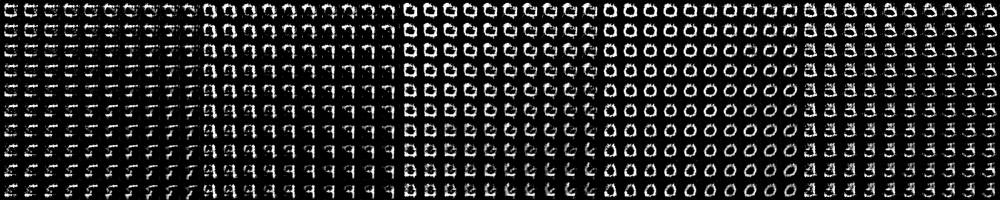

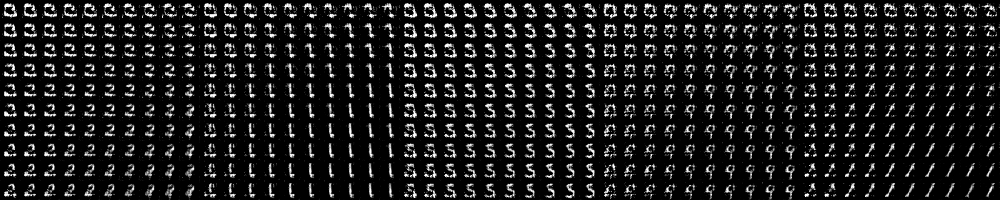

d_err 0.5793681740760803 0.9609375
qy_err 0.022137636318802834 1.0
g_err 1.6159800291061401 0.9921875
qy_err 0.020318888127803802 1.0
qc_err -1.7034097909927368 -1.3239423036575317
epoch= 10


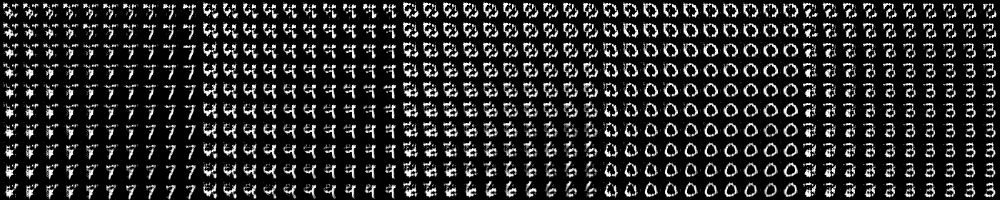

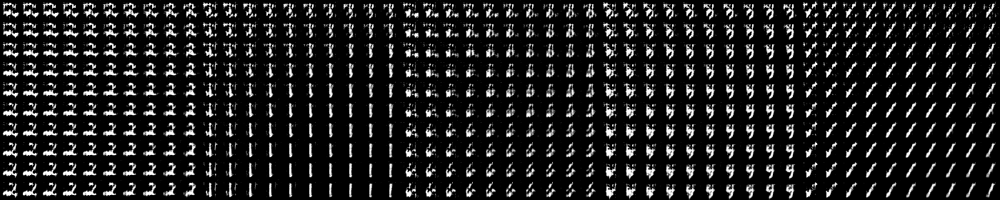

d_err 0.6397280693054199 0.953125
qy_err 0.024345744401216507 1.0
g_err 1.5429829359054565 0.953125
qy_err 0.021577494218945503 1.0
qc_err -1.5705138444900513 -1.7514255046844482
epoch= 11


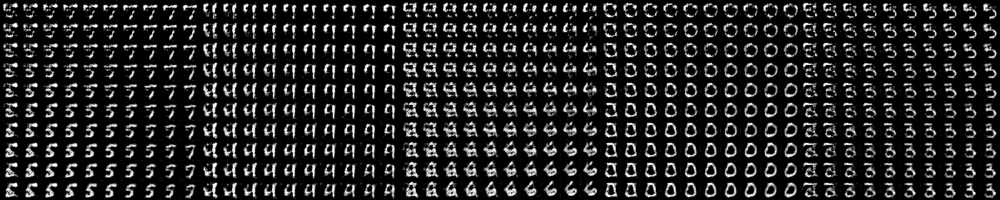

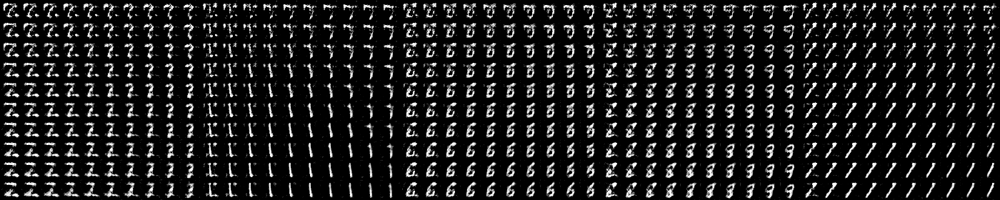

d_err 0.7849417924880981 0.8828125
qy_err 0.019567202776670456 1.0
g_err 1.4502407312393188 0.859375
qy_err 0.014305900782346725 1.0
qc_err -1.7897666692733765 -1.87425696849823
epoch= 12


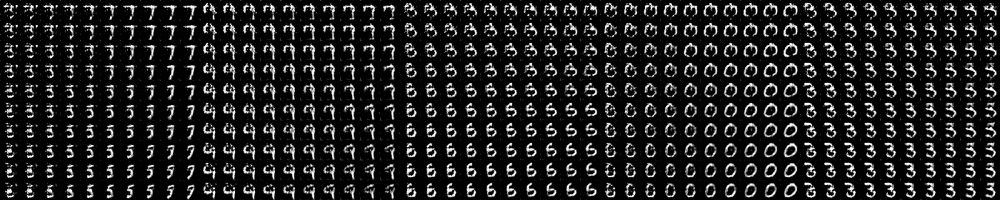

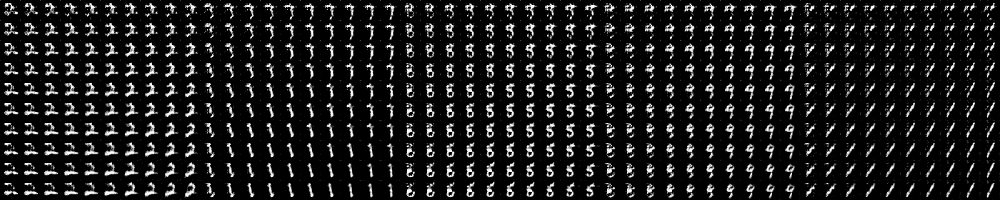

d_err 0.7279728651046753 0.91015625
qy_err 0.01790386438369751 1.0
g_err 1.5211800336837769 0.9921875
qy_err 0.018993787467479706 1.0
qc_err -1.4305899143218994 -1.4586745500564575
epoch= 13


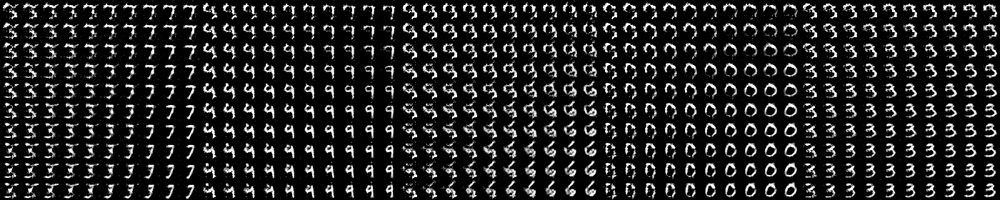

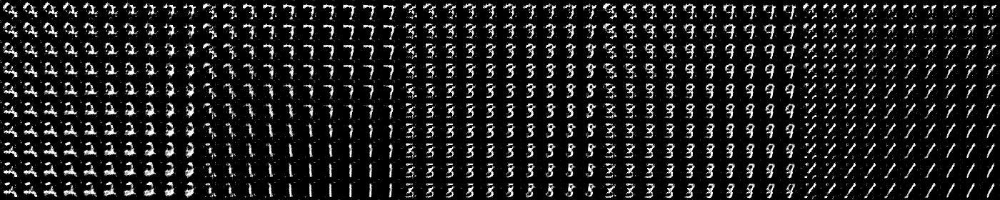

d_err 0.6887695789337158 0.91796875
qy_err 0.014727959409356117 1.0
g_err 1.6375641822814941 0.9921875
qy_err 0.00835130549967289 1.0
qc_err -1.9220186471939087 -2.03076434135437
epoch= 14


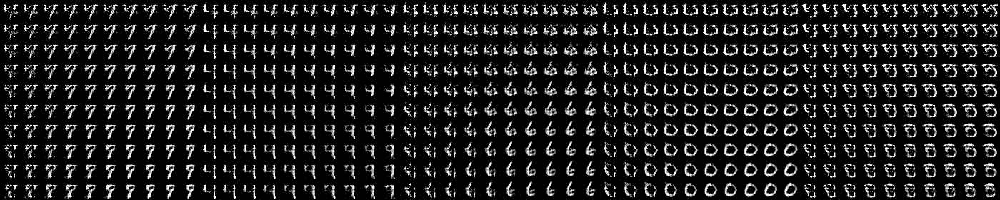

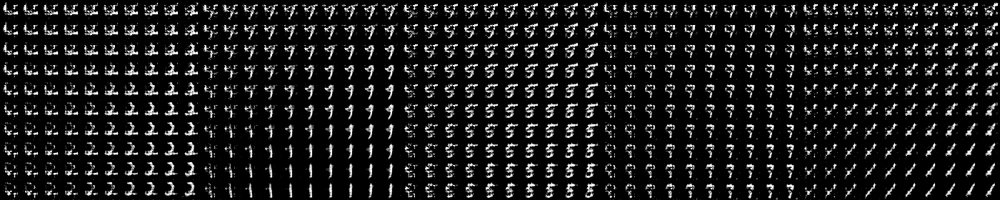

d_err 0.6342827081680298 0.953125
qy_err 0.013039175420999527 1.0
g_err 1.4619196653366089 0.9609375
qy_err 0.01729843020439148 1.0
qc_err -1.8988406658172607 -1.659445881843567
epoch= 15


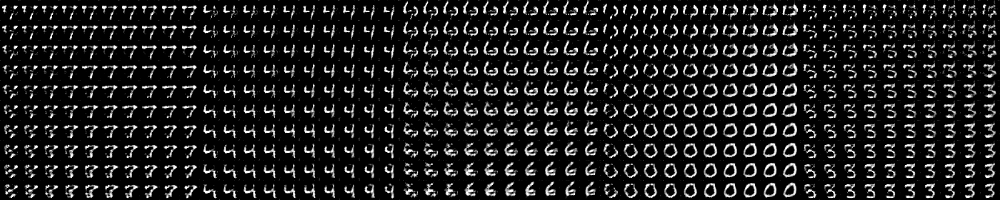

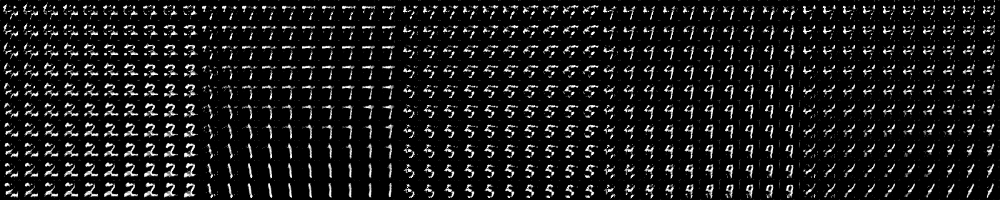

d_err 0.6464991569519043 0.92578125
qy_err 0.02247551456093788 1.0
g_err 1.6045362949371338 0.96875
qy_err 0.012157483026385307 1.0
qc_err -1.926527976989746 -1.9836033582687378
epoch= 16


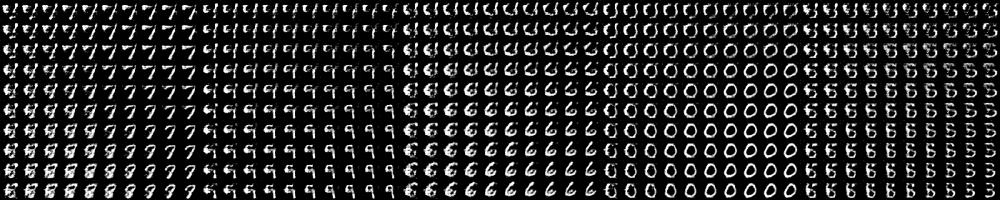

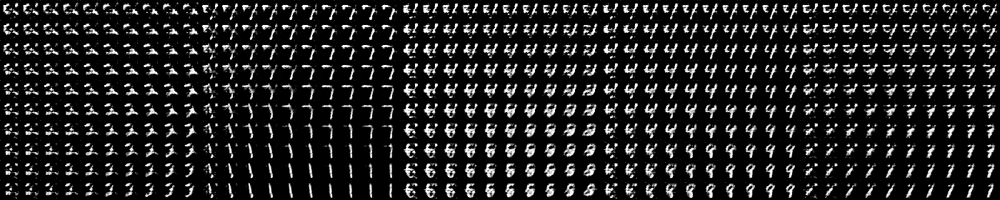

d_err 0.7250386476516724 0.87890625
qy_err 0.009300172328948975 1.0
g_err 1.7428500652313232 0.9140625
qy_err 0.013016811572015285 1.0
qc_err -1.7582314014434814 -1.6378045082092285
epoch= 17


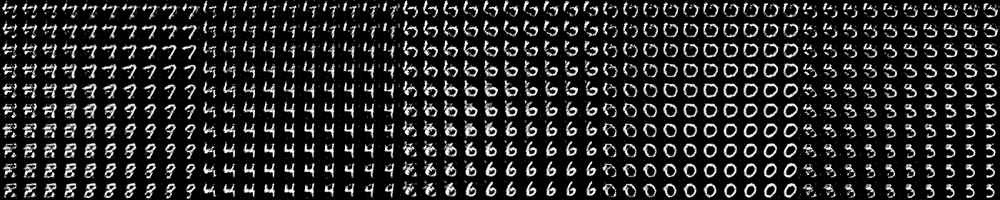

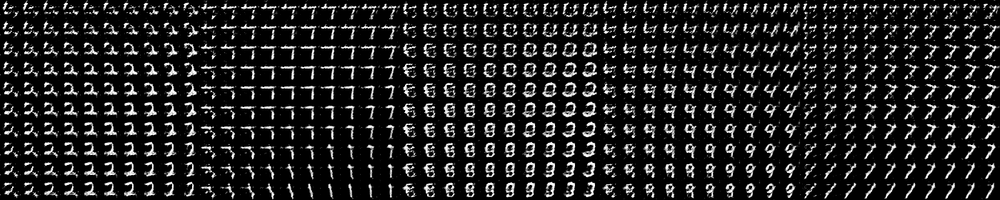

d_err 0.688585638999939 0.90234375
qy_err 0.019075743854045868 1.0
g_err 1.6670851707458496 0.953125
qy_err 0.025222115218639374 1.0
qc_err -1.790947675704956 -2.091097831726074
epoch= 18


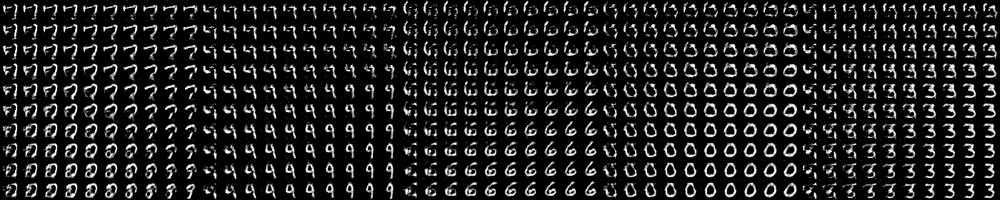

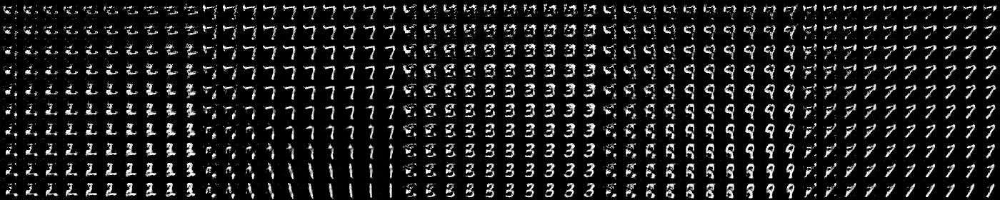

d_err 0.7381663918495178 0.89453125
qy_err 0.026474706828594208 1.0
g_err 1.4232383966445923 0.9296875
qy_err 0.01851075515151024 1.0
qc_err -1.8735318183898926 -1.65663743019104
epoch= 19


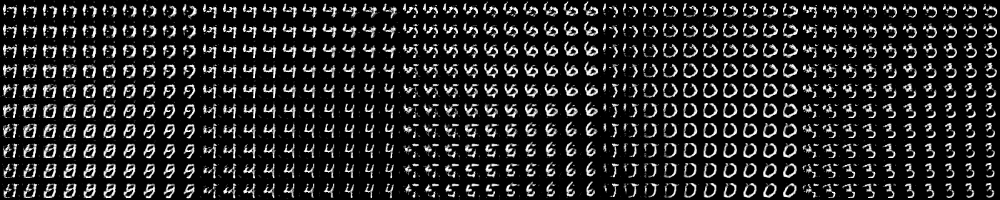

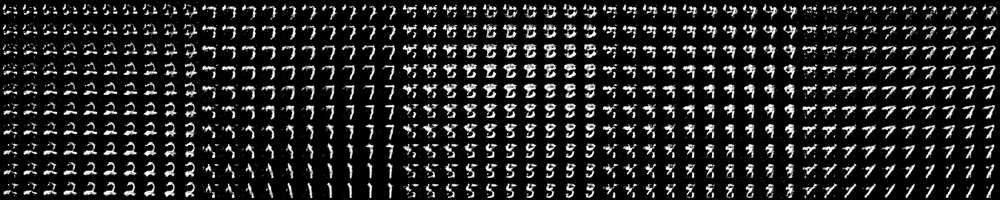

d_err 0.6579087972640991 0.90625
qy_err 0.025829073041677475 1.0
g_err 1.5445083379745483 0.953125
qy_err 0.016766108572483063 1.0
qc_err -2.083059787750244 -1.7650450468063354
epoch= 20


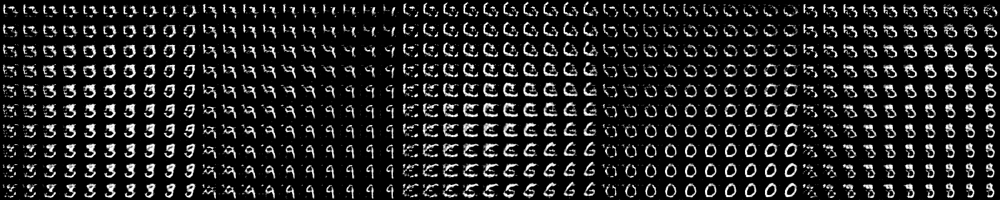

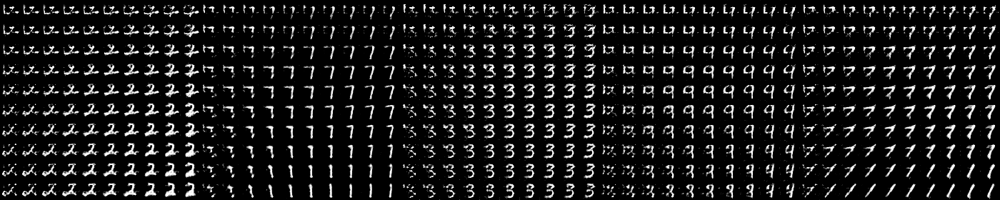

d_err 0.5714701414108276 0.953125
qy_err 0.013618106953799725 1.0
g_err 1.5503277778625488 0.953125
qy_err 0.021515775471925735 0.9921875
qc_err -2.1147961616516113 -2.0300040245056152
epoch= 21


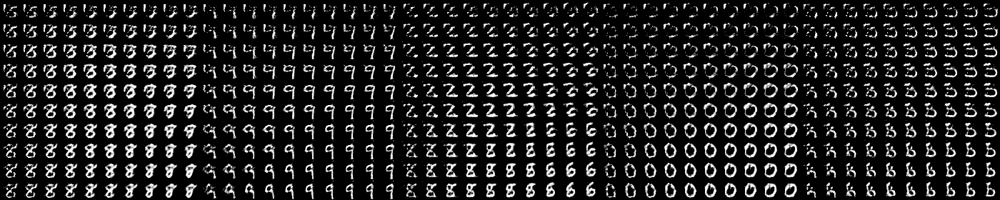

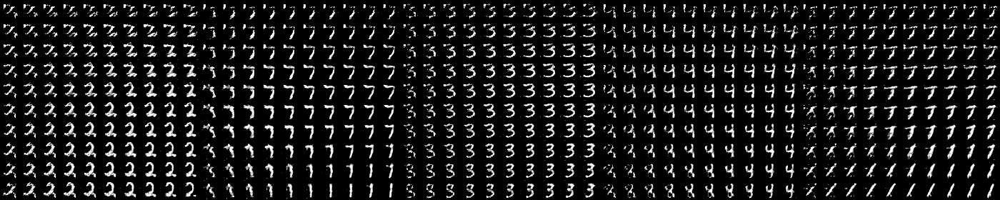

d_err 0.6834057569503784 0.90234375
qy_err 0.017633259296417236 1.0
g_err 1.5453115701675415 0.9765625
qy_err 0.015265749767422676 1.0
qc_err -1.3368065357208252 -1.8978965282440186
epoch= 22


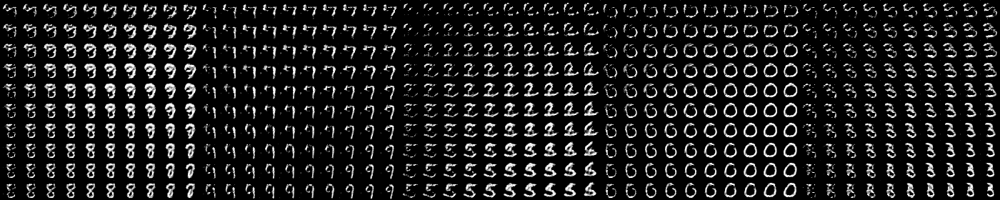

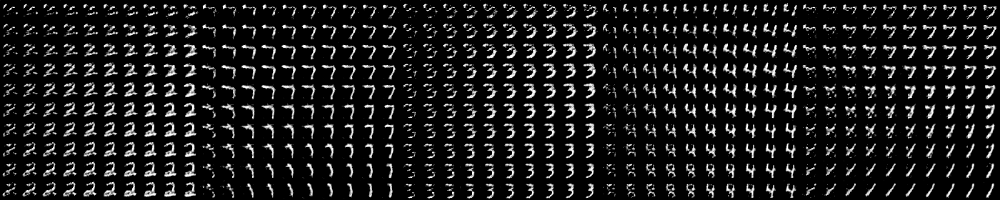

d_err 0.7024251222610474 0.921875
qy_err 0.01867099478840828 1.0
g_err 1.5134429931640625 0.9609375
qy_err 0.015396690927445889 1.0
qc_err -2.0782909393310547 -1.8903456926345825
epoch= 23


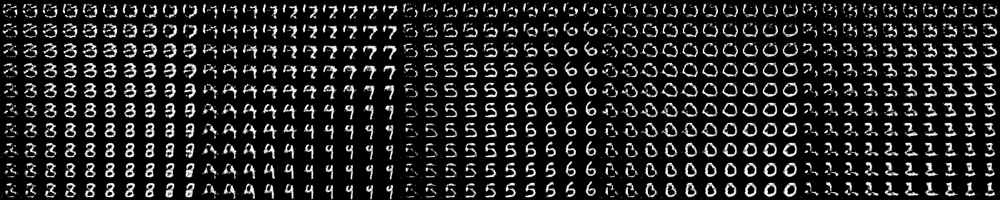

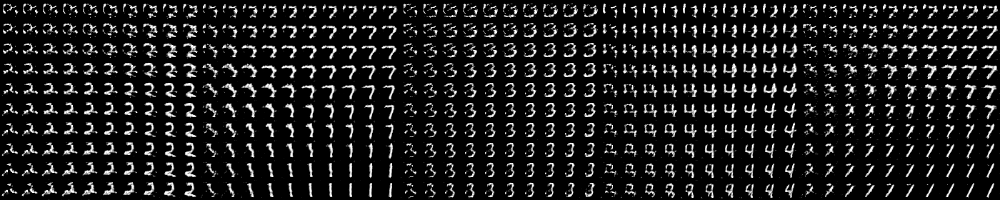

d_err 0.6746238470077515 0.9296875
qy_err 0.009928807616233826 1.0
g_err 1.4830600023269653 0.9609375
qy_err 0.009867418557405472 1.0
qc_err -1.9509202241897583 -2.1830554008483887
epoch= 24


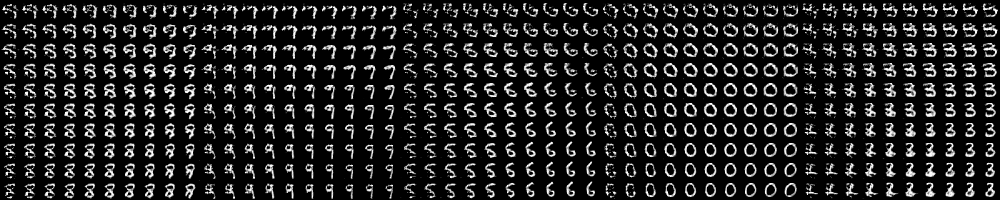

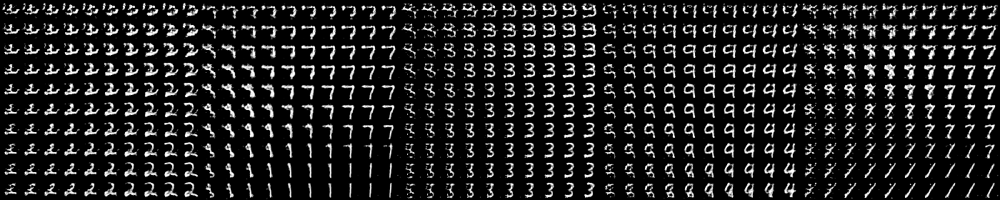

d_err 0.7145543694496155 0.87890625
qy_err 0.013683967292308807 1.0
g_err 1.6127941608428955 0.9765625
qy_err 0.01743951067328453 1.0
qc_err -2.1385951042175293 -2.0335912704467773
epoch= 25


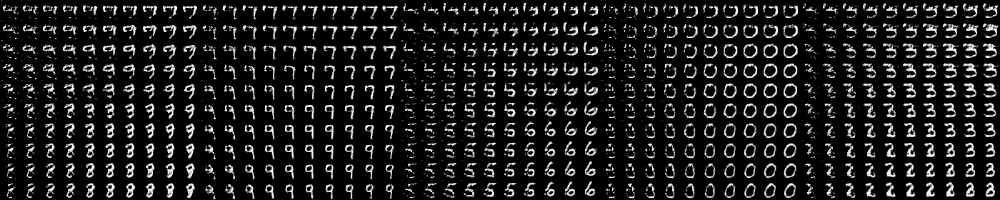

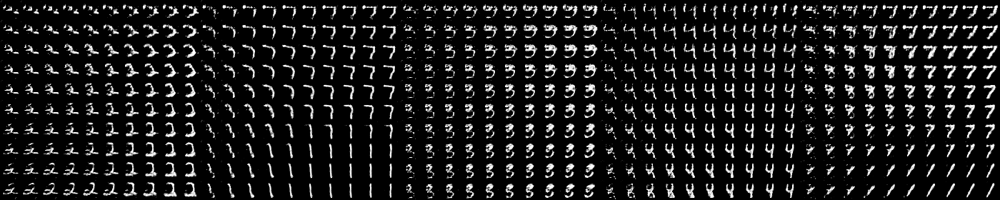

d_err 0.6881436109542847 0.890625
qy_err 0.016589395701885223 1.0
g_err 1.5064215660095215 0.9140625
qy_err 0.007685424759984016 1.0
qc_err -2.120680809020996 -1.7075042724609375
epoch= 26


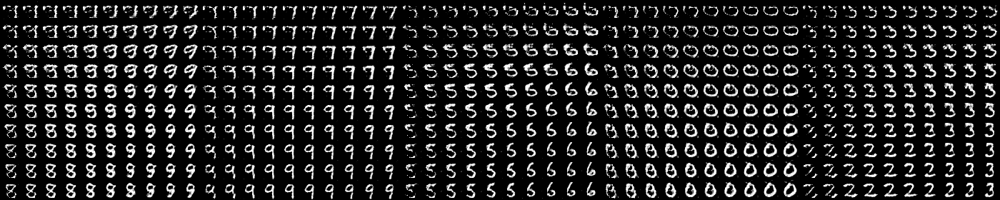

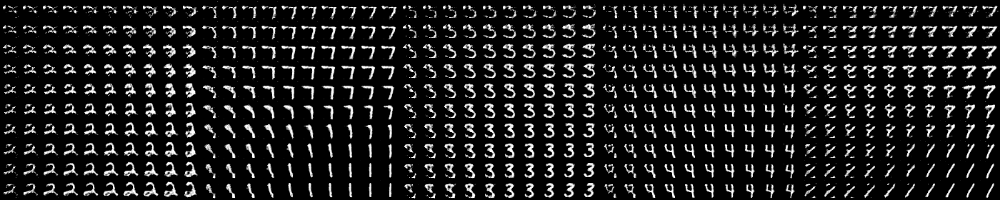

d_err 0.7747913599014282 0.8515625
qy_err 0.022155307233333588 1.0
g_err 1.6606097221374512 0.90625
qy_err 0.02587215229868889 0.984375
qc_err -1.9063969850540161 -1.8824334144592285
epoch= 27


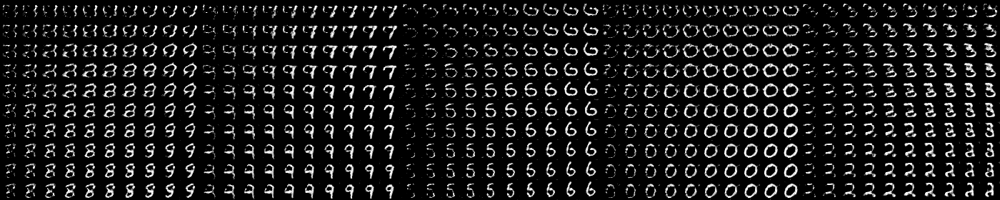

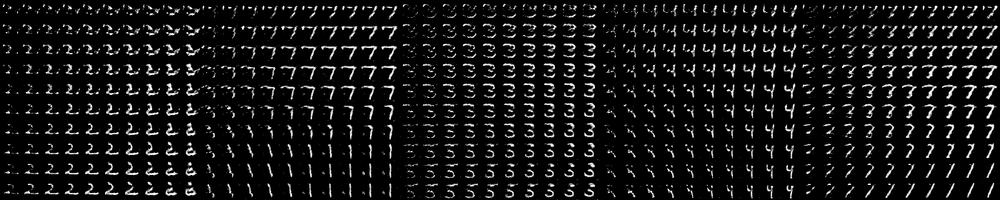

d_err 0.7107175588607788 0.90234375
qy_err 0.04415009170770645 0.984375
g_err 1.570069432258606 0.96875
qy_err 0.017551599070429802 1.0
qc_err -1.7792112827301025 -1.7722597122192383
epoch= 28


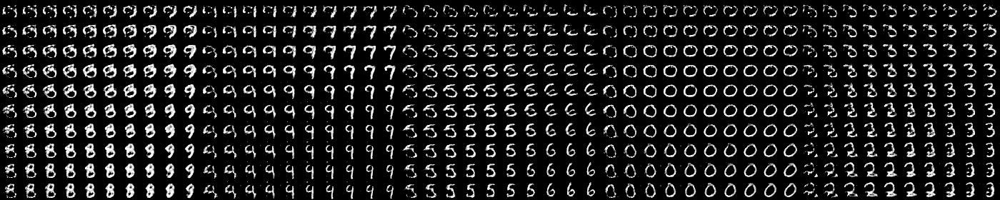

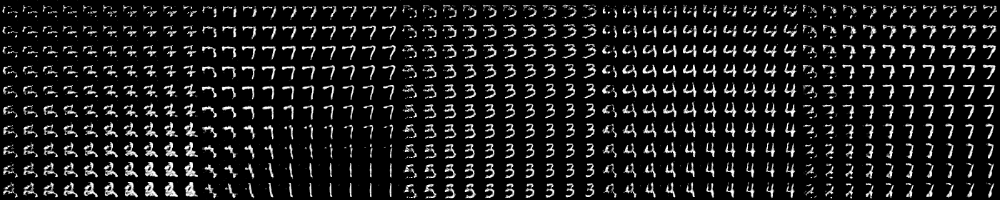

d_err 0.7473877668380737 0.875
qy_err 0.01906958967447281 1.0
g_err 1.597802996635437 0.8984375
qy_err 0.012502748519182205 1.0
qc_err -2.169271230697632 -1.8851420879364014
epoch= 29


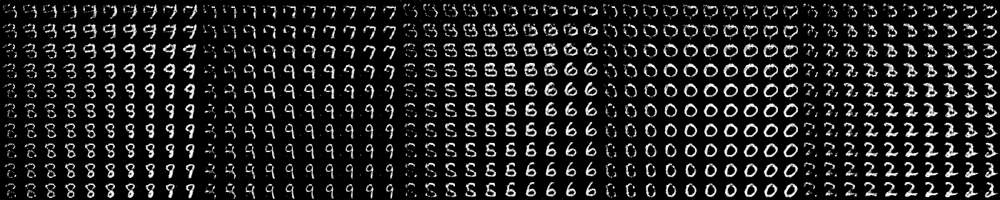

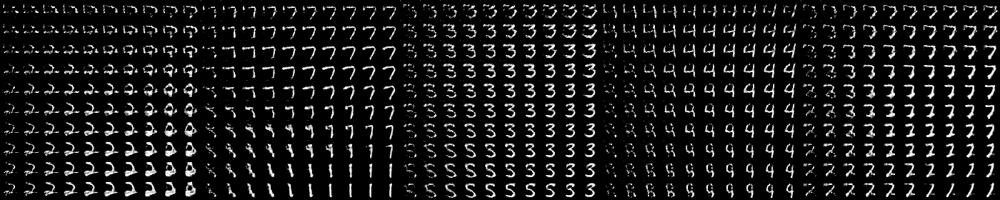

d_err 0.7394210696220398 0.8671875
qy_err 0.017558863386511803 1.0
g_err 1.5300662517547607 0.9453125
qy_err 0.008378748781979084 1.0
qc_err -1.724738597869873 -1.640426516532898
epoch= 30


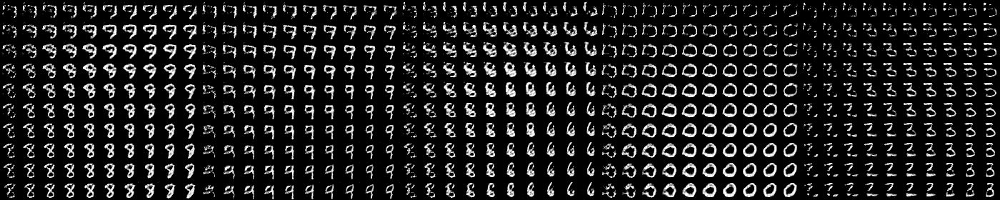

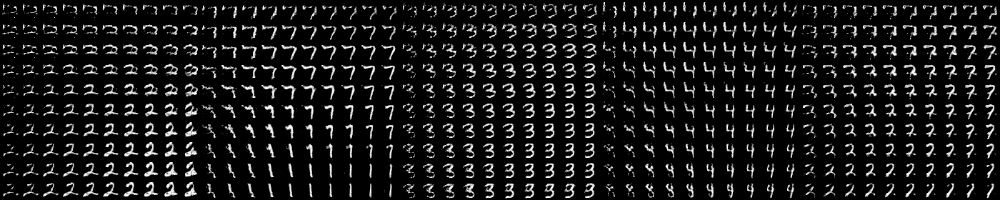

d_err 0.6796455383300781 0.88671875
qy_err 0.00888301245868206 1.0
g_err 1.6582063436508179 0.9375
qy_err 0.009229084476828575 1.0
qc_err -2.053978681564331 -2.2173233032226562
epoch= 31


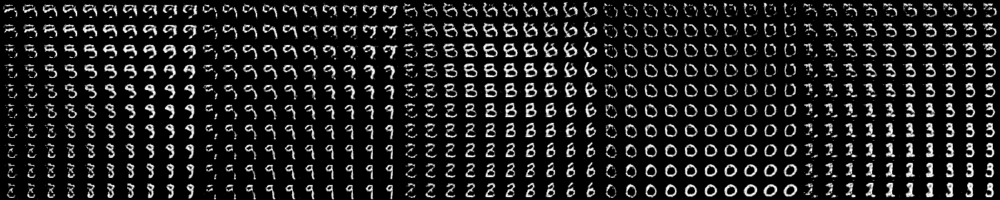

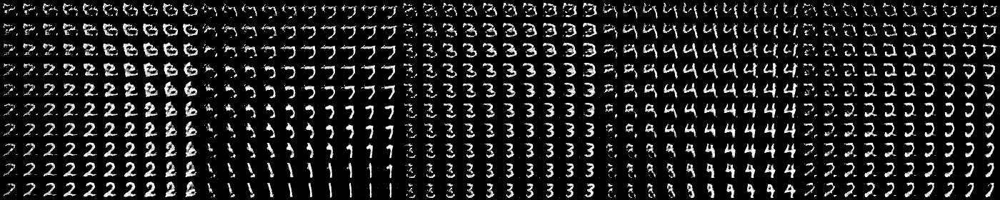

d_err 0.5884957313537598 0.95703125
qy_err 0.020114146173000336 1.0
g_err 1.6428450345993042 0.984375
qy_err 0.024903984740376472 0.9921875
qc_err -1.8684329986572266 -1.8966187238693237
epoch= 32


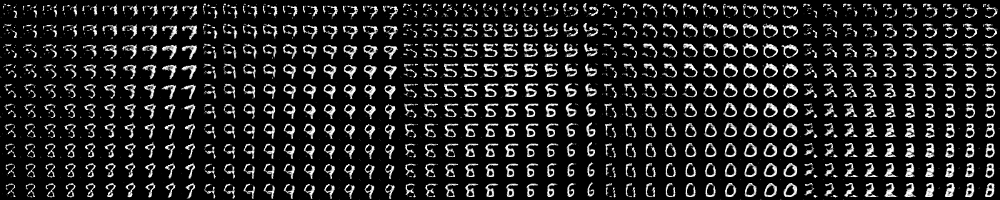

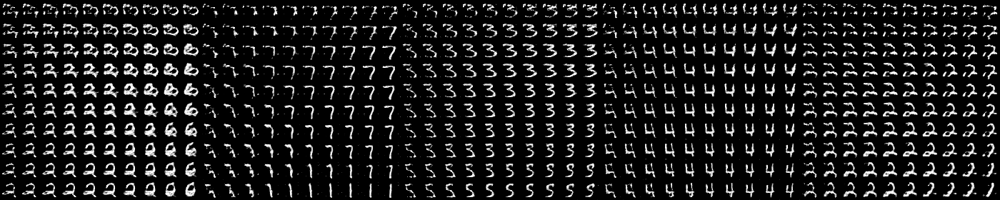

d_err 0.7374812364578247 0.875
qy_err 0.026600774377584457 0.9921875
g_err 1.6863352060317993 0.8984375
qy_err 0.009266759268939495 1.0
qc_err -1.9931565523147583 -2.0455756187438965
epoch= 33


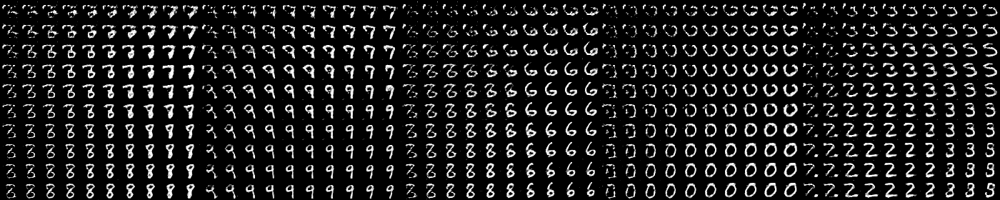

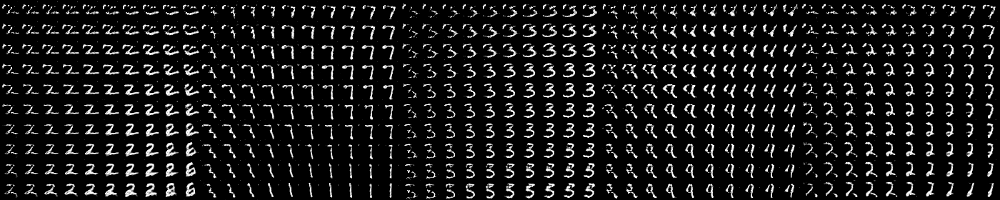

d_err 0.7073323726654053 0.92578125
qy_err 0.006257329601794481 1.0
g_err 1.4823561906814575 0.9375
qy_err 0.012621454894542694 1.0
qc_err -2.0079188346862793 -2.17380952835083
epoch= 34


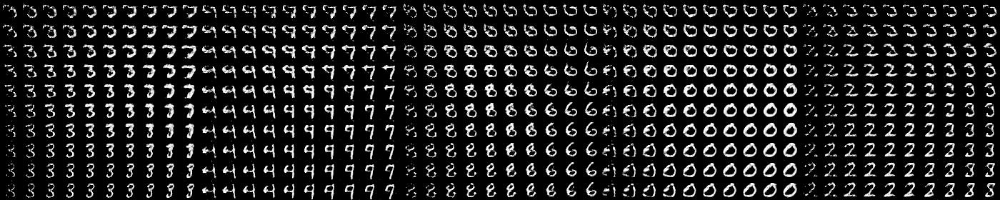

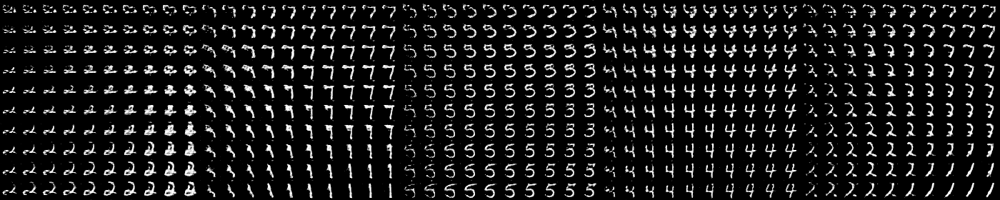

d_err 0.5984401702880859 0.93359375
qy_err 0.01023801602423191 1.0
g_err 1.4905731678009033 0.90625
qy_err 0.014145957306027412 0.9921875
qc_err -2.1499786376953125 -1.7650916576385498
epoch= 35


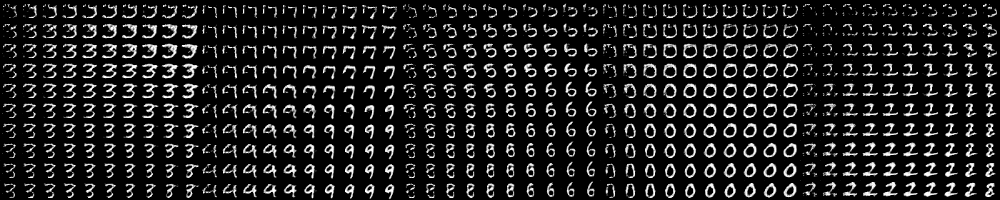

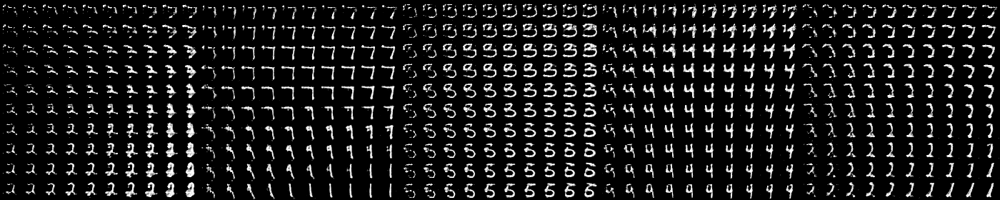

d_err 0.7659480571746826 0.8671875
qy_err 0.006758382543921471 1.0
g_err 1.6547359228134155 0.8828125
qy_err 0.021892806515097618 0.9921875
qc_err -2.124148368835449 -1.5686018466949463
epoch= 36


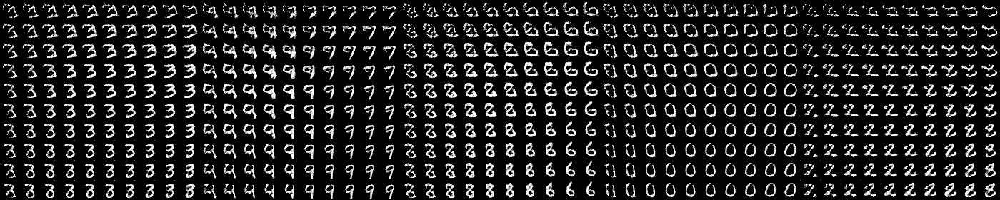

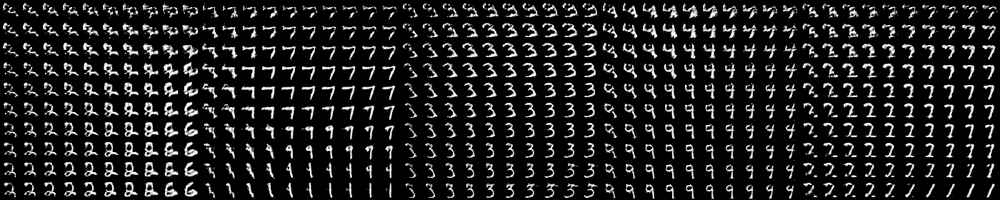

d_err 0.6549263000488281 0.93359375
qy_err 0.030932914465665817 0.9921875
g_err 1.7391414642333984 0.953125
qy_err 0.0074712964706122875 1.0
qc_err -2.3047404289245605 -1.944947600364685
epoch= 37


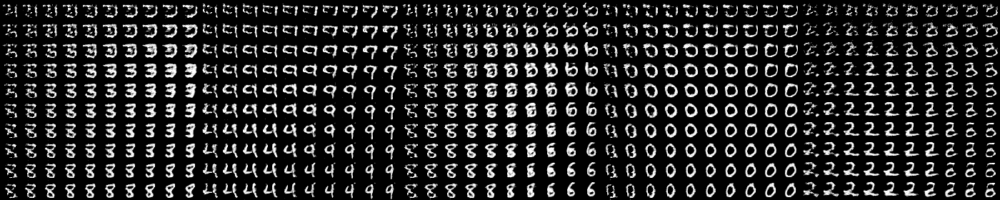

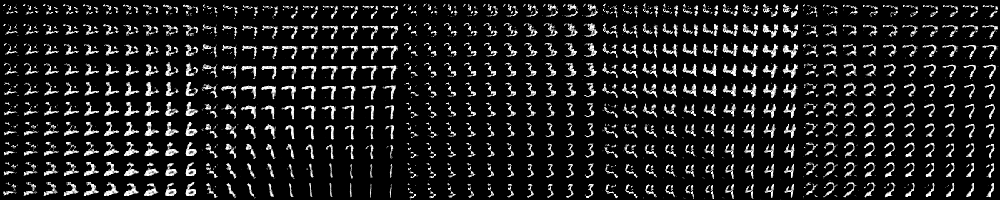

d_err 0.811354398727417 0.8203125
qy_err 0.012918747030198574 1.0
g_err 1.7441425323486328 0.8671875
qy_err 0.010379472747445107 1.0
qc_err -1.5511786937713623 -1.834054946899414
epoch= 38


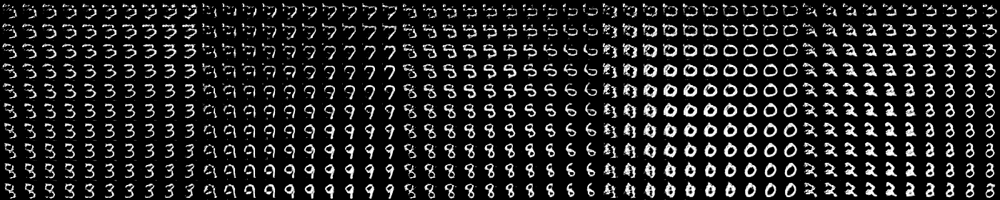

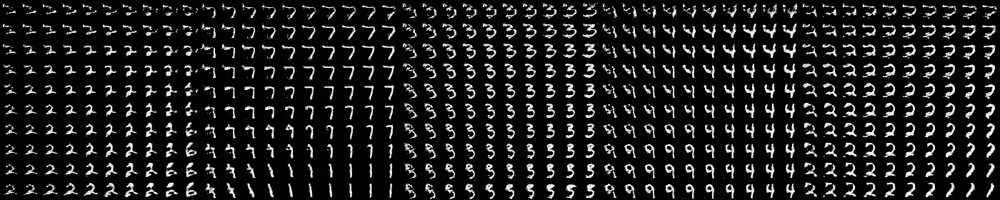

d_err 0.8556802272796631 0.85546875
qy_err 0.015996353700757027 1.0
g_err 1.5740439891815186 0.8828125
qy_err 0.02013426460325718 1.0
qc_err -2.023656129837036 -2.177640438079834
epoch= 39


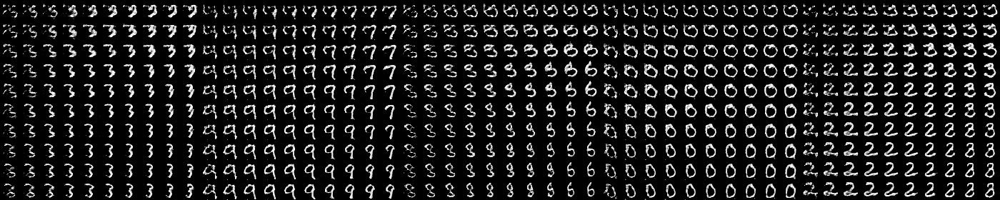

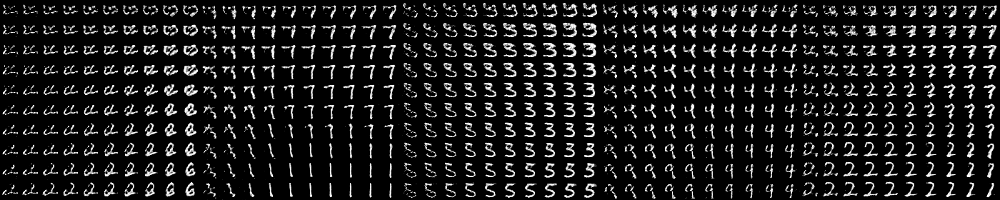

d_err 0.6850241422653198 0.85546875
qy_err 0.012603037990629673 1.0
g_err 1.8105404376983643 0.9140625
qy_err 0.00834464281797409 1.0
qc_err -1.8007169961929321 -1.8561686277389526
epoch= 40


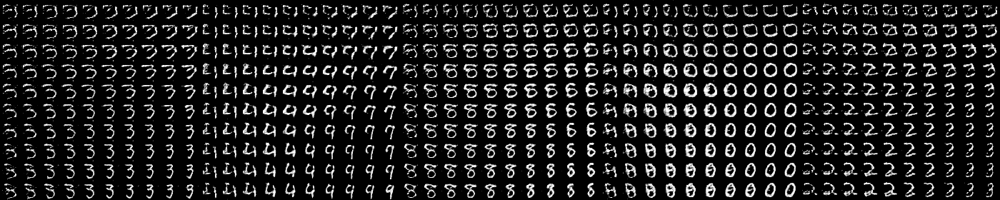

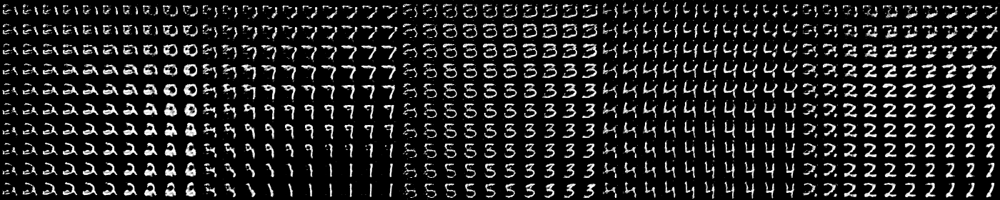

d_err 0.7694606781005859 0.84765625
qy_err 0.03309480845928192 0.9921875
g_err 1.3922443389892578 0.8203125
qy_err 0.014006673358380795 1.0
qc_err -1.9237569570541382 -1.65664541721344
epoch= 41


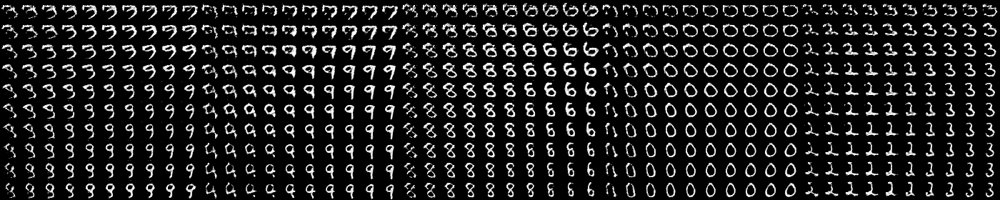

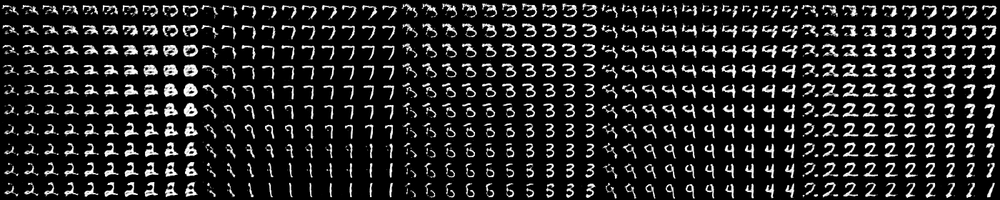

d_err 0.6303731799125671 0.921875
qy_err 0.023104337975382805 0.9921875
g_err 1.689570426940918 0.9609375
qy_err 0.004904468543827534 1.0
qc_err -2.130694627761841 -2.2143919467926025
epoch= 42


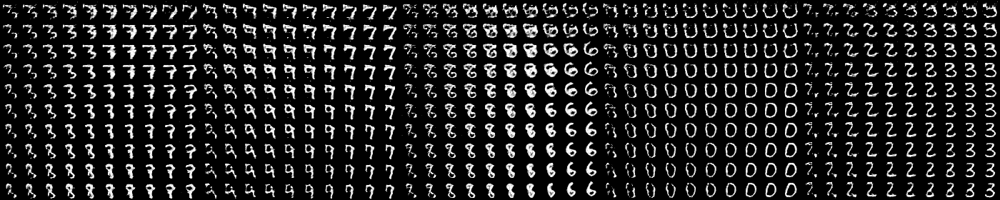

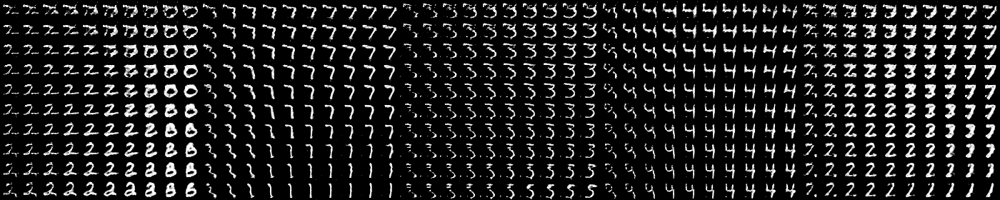

d_err 0.6122584342956543 0.9140625
qy_err 0.014496278017759323 1.0
g_err 1.623270034790039 0.90625
qy_err 0.009835861623287201 1.0
qc_err -1.637341856956482 -2.1351945400238037
epoch= 43


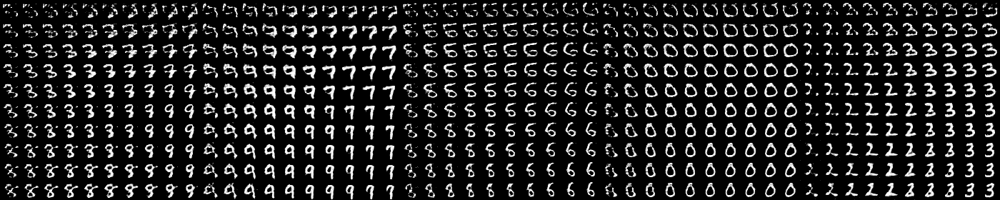

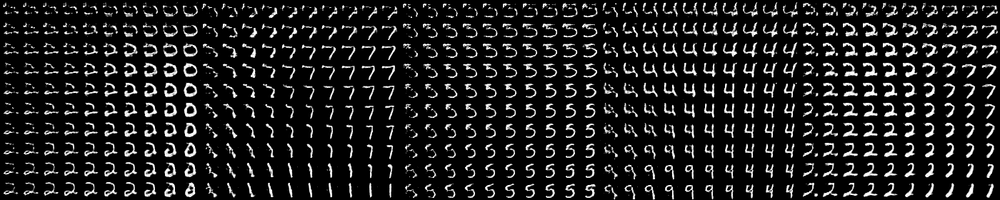

d_err 0.5332821011543274 0.94921875
qy_err 0.009887538850307465 1.0
g_err 1.5640349388122559 0.9296875
qy_err 0.00619094492867589 1.0
qc_err -2.1865620613098145 -2.1577765941619873
epoch= 44


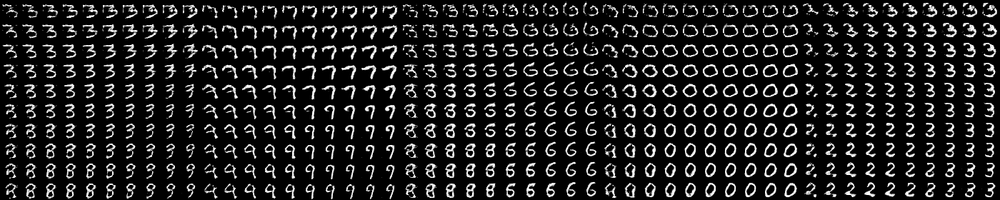

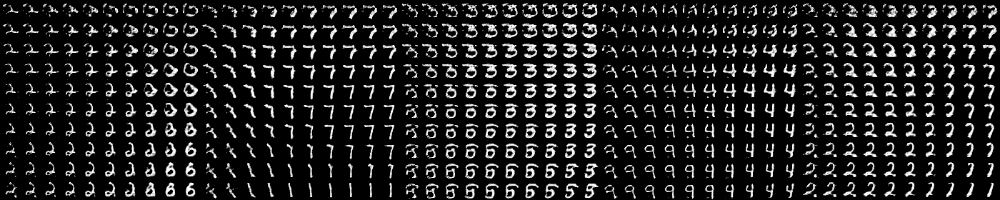

d_err 0.6002418994903564 0.91015625
qy_err 0.019143907353281975 1.0
g_err 1.864302158355713 0.9765625
qy_err 0.023785706609487534 0.9921875
qc_err -2.221500873565674 -1.9913759231567383
epoch= 45


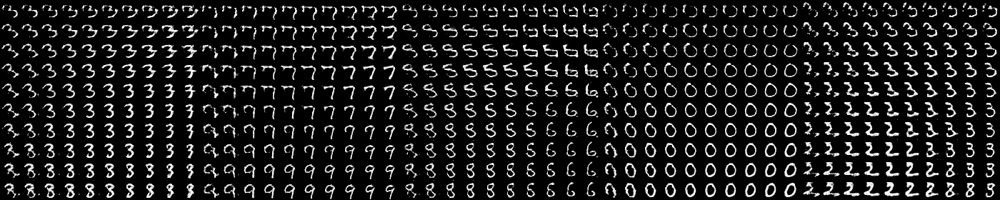

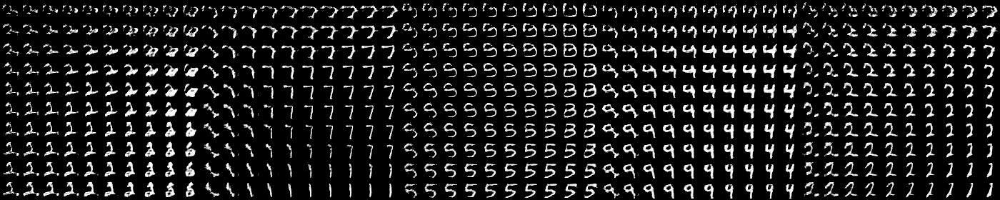

d_err 0.6768405437469482 0.8984375
qy_err 0.007657031062990427 1.0
g_err 1.546445608139038 0.8671875
qy_err 0.01902780309319496 0.9921875
qc_err -1.9948880672454834 -2.1424124240875244
epoch= 46


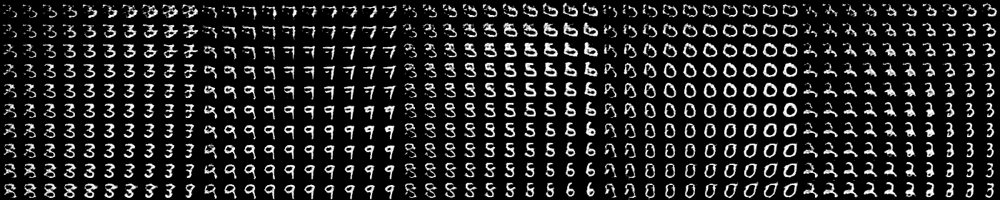

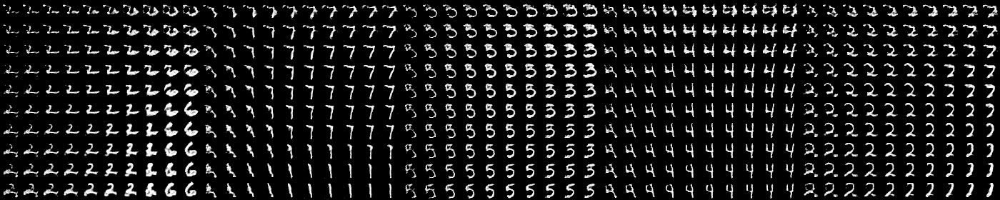

d_err 0.6330844163894653 0.91015625
qy_err 0.00925403367727995 1.0
g_err 1.711462140083313 0.9140625
qy_err 0.03925212472677231 0.984375
qc_err -2.239071846008301 -2.063197374343872
epoch= 47


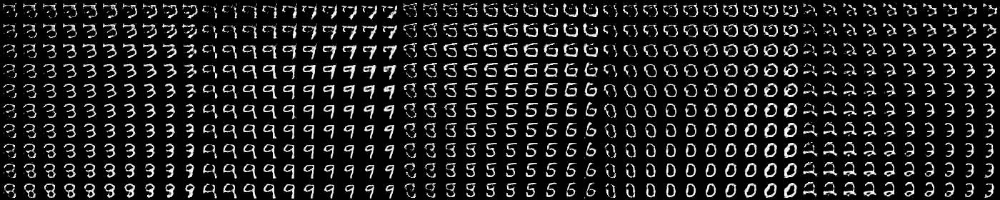

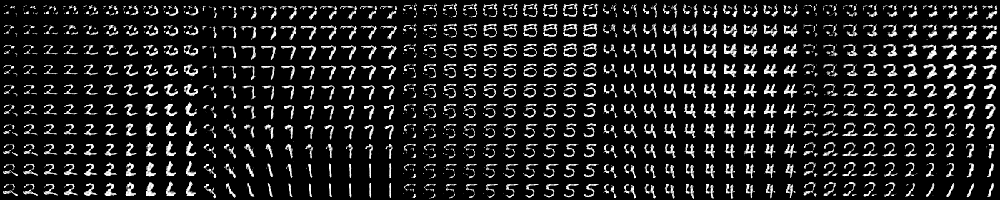

d_err 0.5903950929641724 0.91015625
qy_err 0.00709383562207222 1.0
g_err 1.8022966384887695 0.921875
qy_err 0.010972120799124241 1.0
qc_err -2.2505550384521484 -2.131777763366699
epoch= 48


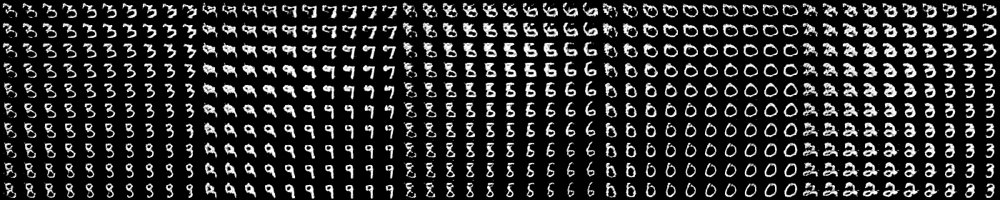

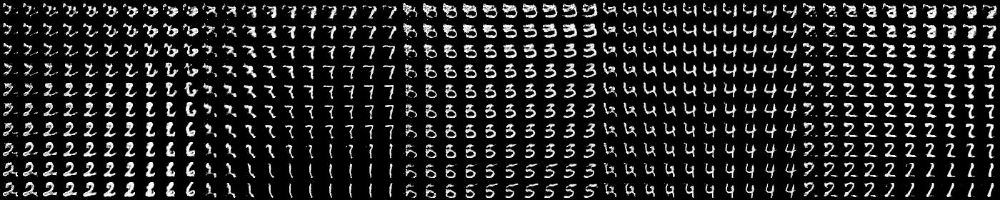

d_err 0.8384660482406616 0.8046875
qy_err 0.03235415369272232 0.9921875
g_err 1.6492705345153809 0.8515625
qy_err 0.032020531594753265 0.9921875
qc_err -2.233032703399658 -2.095118761062622
epoch= 49


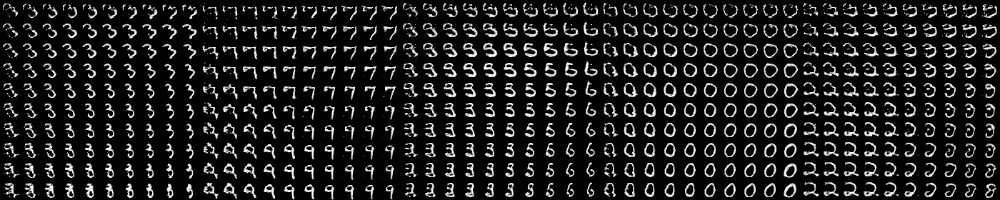

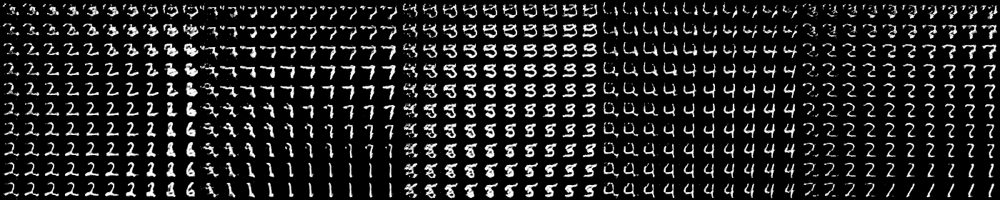

d_err 0.6012118458747864 0.91015625
qy_err 0.00825066864490509 1.0
g_err 1.7791575193405151 0.9375
qy_err 0.00489669106900692 1.0
qc_err -1.962655782699585 -2.0423130989074707


In [21]:
for epoch in range(50):
    for j in range(100):
        d_err, qy_err, qc_err, d_acc, qy_acc = train_discriminator_fn(sample_X(), sample_Y(), sample_C(), sample_Z())         
        g_err, qy_err2, qc_err2, g_acc, qy_acc2 = train_generator_fn(sample_Y(), sample_C(), sample_Z())    
    printx("epoch=", epoch)
    show_result(10)
    printx("d_err", d_err, d_acc)
    printx("qy_err", qy_err, qy_acc)
    printx("g_err", g_err, g_acc)
    printx("qy_err", qy_err2, qy_acc2)
    printx("qc_err", qc_err, qc_err2)

In [22]:
Y=np.zeros((100,10),dtype='float32')        
Y[arange(100), arange(100)//10]=1
C=np.array([ [0.1+0.08*(i%10)]*2 for i in range(100)], dtype='float32')
imgs = generator_fn(Y, C, sample_Z(100))
for i in range(0, 100, 10):
    show(imgs[i:i+10])

In [23]:
#np.savez('cifar10_gan_classifier_generator.npz', lasagne.layers.get_all_param_values(l_generator))
#np.savez('cifar10_gan_classifier_discriminator.npz', lasagne.layers.get_all_param_values(l_discriminator))
#np.savez('cifar10_gan_classifier_classifier.npz', lasagne.layers.get_all_param_values(l_classifier))


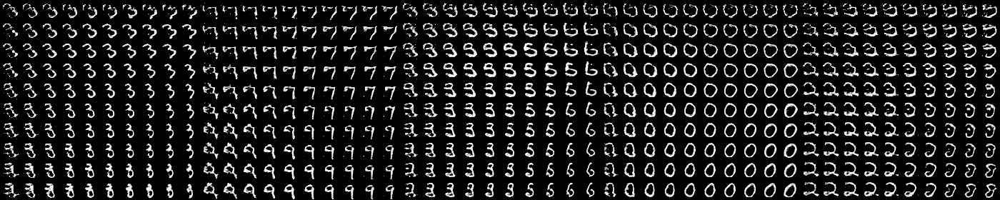

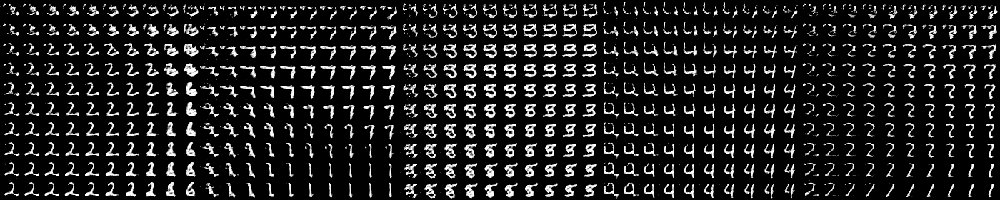

In [24]:
show_result(10)